# DEMO VIDEO — Vietnamese Food VQA
**Dự án:** Hệ thống Hỏi đáp trên Ảnh (VQA) — Ẩm thực Việt Nam  
**Môn học:** Deep Learning — Cuối kỳ  

Notebook này dùng để **quay video demo** hệ thống, bao gồm:
- Phần 1: Demo **A1** — ResNet50 + LSTM Decoder
- Phần 2: Demo **A2** — ResNet50 + Transformer Decoder
- Phần 3: Demo **B1** — PaliGemma Zero-shot
- Phần 4: Demo **B2** — PaliGemma Fine-tuned (LoRA)
- Phần 5: **So sánh đồng thời** A1 + A2 + B1 + B2 trên cùng mẫu
- Phần 6: **Biểu đồ Metrics** 4 cấu hình
- Phần 7: **Interactive Demo** — upload ảnh + nhập câu hỏi tùy ý

## 0. Cài đặt & Mount Drive

In [1]:
!pip install -q transformers accelerate peft bitsandbytes bert-score
!pip install -q Pillow tqdm sentencepiece protobuf matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.7/60.7 MB 44.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 kB 6.5 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')

# ── CHỈ SỬA PHẦN NÀY ─────────────────────────────────────────────────────────
DRIVE_ROOT   = "/content/drive/MyDrive/Vietnamese_Cuisine_v1.0"

IMG_DIR      = f"{DRIVE_ROOT}/images"
TEST_JSON    = f"{DRIVE_ROOT}/splits/test.json"
VOCAB_PATH   = f"{DRIVE_ROOT}/answer_vocab.json"

CKPT_A1      = f"{DRIVE_ROOT}/checkpoints/best_vqa_a1.pth"
CKPT_A2      = f"{DRIVE_ROOT}/checkpoints/best_vqa_a2.pth"
CKPT_B2_DIR  = "/content/drive/MyDrive/paligemma_vqa_lora"

PRED_B1_JSON = f"{DRIVE_ROOT}/predictions_B1.json"
PRED_B2_JSON = f"{DRIVE_ROOT}/predictions_B2.json"

PALIGEMMA_ID   = "google/paligemma-3b-pt-224"
MAX_NEW_TOKENS = 20
# ─────────────────────────────────────────────────────────────────────────────

import os, sys
sys.path.append('/content')

# Copy metrics.py tu MyDrive vao /content
!cp /content/drive/MyDrive/metrics.py /content/metrics.py 2>/dev/null || echo "[WARN] metrics.py chua co tren Drive"

# Copy src neu co
!cp -r {DRIVE_ROOT}/src /content/src 2>/dev/null || echo "[INFO] Khong co /src tren Drive"

print(' Mount & setup xong!')

Mounted at /content/drive
[INFO] Khong co /src tren Drive
 Mount & setup xong!


## 1. Import tổng hợp

In [3]:
import os, json, sys, math
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
from torchvision import transforms, models
from transformers import (
    AutoTokenizer,
    PaliGemmaProcessor,
    PaliGemmaForConditionalGeneration,
    BitsAndBytesConfig,
)
from peft import PeftModel
import torch.nn as nn

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Device : {DEVICE}')
print(f'GPU    : {torch.cuda.get_device_name(0) if torch.cuda.is_available() else "None"}')

Device : cuda
GPU    : NVIDIA A100-SXM4-40GB


## 2. Định nghĩa Model — Encoder dùng chung (từ encoder.py)

In [4]:
# ══════════════════════════════════════════════════════════════════════════════
# ENCODER — Copy inline từ encoder.py của Quang
# Dùng chung cho cả A1 lẫn A2
# ══════════════════════════════════════════════════════════════════════════════

class ImageEncoder(nn.Module):
    """ResNet-50 bỏ FC cuối. Output: (B, 2048)."""
    def __init__(self, fine_tune_last_block=False):
        super().__init__()
        resnet = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        self.feature_extractor = nn.Sequential(*list(resnet.children())[:-1])
        for p in self.feature_extractor.parameters():
            p.requires_grad = False
        if fine_tune_last_block:
            for p in self.feature_extractor[-2].parameters():
                p.requires_grad = True

    def forward(self, images):
        return torch.flatten(self.feature_extractor(images), 1)  # (B, 2048)


class TextEncoder(nn.Module):
    """Embedding + LSTM. Output: (B, 512) — hidden state cuối."""
    def __init__(self, vocab_size=64001, embed_dim=300, hidden_dim=512, num_layers=1):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=1)
        self.lstm = nn.LSTM(embed_dim, hidden_dim, num_layers,
                            batch_first=True, bidirectional=False)

    def forward(self, question_ids):
        _, (h_n, _) = self.lstm(self.embedding(question_ids))
        return h_n[-1]  # (B, 512)


print(' Encoder (chung A1 & A2) OK')

 Encoder (chung A1 & A2) OK


## 3. Định nghĩa Model A1 — LSTM Decoder (từ lstm_dec.py)

**Kiến trúc:** ResNet50 → (B,2048) · LSTM TextEncoder → (B,512) · FusionLayer (Hadamard) → (B,512) · **LSTMDecoder** → sinh chuỗi token

> Checkpoint `best_vqa_a1.pth` được train bởi `train.py --model a1` (autoregressive, CrossEntropyLoss trên chuỗi).

In [5]:
# ══════════════════════════════════════════════════════════════════════════════
# CẤU HÌNH A1: ResNet50 + LSTM Text Encoder + LSTM Decoder (SINH CHUỖI)
# Copy inline từ lstm_dec.py — ĐỒNG NHẤT với train.py
# ══════════════════════════════════════════════════════════════════════════════

import math

class PositionalEncoding_A1(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=200):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        self.register_buffer('pe', pe.unsqueeze(0))
    def forward(self, x):
        return self.dropout(x + self.pe[:, :x.size(1), :])


class FusionLayer_A1(nn.Module):
    """Hadamard Product fusion — đồng nhất lstm_dec.py."""
    def __init__(self, img_feat_dim=2048, txt_feat_dim=512, joint_dim=512, dropout=0.5):
        super().__init__()
        self.img_proj = nn.Sequential(
            nn.Linear(img_feat_dim, joint_dim), nn.LayerNorm(joint_dim),
            nn.ReLU(), nn.Dropout(dropout),
        )
        self.txt_proj = nn.Sequential(
            nn.Linear(txt_feat_dim, joint_dim), nn.LayerNorm(joint_dim),
            nn.ReLU(), nn.Dropout(dropout),
        )
    def forward(self, img_feats, txt_feats):
        return self.img_proj(img_feats) * self.txt_proj(txt_feats)


class LSTMDecoder_A1(nn.Module):
    def __init__(self, vocab_size, embed_dim=256, hidden_dim=512, num_layers=2, dropout=0.3):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=1)
        self.pos_enc   = PositionalEncoding_A1(embed_dim, dropout)
        self.lstm      = nn.LSTM(embed_dim, hidden_dim, num_layers,
                                 batch_first=True,
                                 dropout=dropout if num_layers > 1 else 0.0)
        self.fc_out    = nn.Linear(hidden_dim, vocab_size)
        self.dropout   = nn.Dropout(dropout)

    def forward(self, decoder_input_ids, memory, h0=None, c0=None):
        if h0 is None:
            h0 = memory.unsqueeze(0).expand(self.lstm.num_layers, -1, -1).contiguous()
            c0 = torch.zeros_like(h0)
        embeds = self.pos_enc(self.embedding(decoder_input_ids))
        out, _ = self.lstm(embeds, (h0, c0))
        return self.fc_out(self.dropout(out))


class VQA_A1_Model(nn.Module):
    """A1: ResNet50 + LSTM TextEncoder + LSTM Decoder (sinh chuỗi)."""
    def __init__(self, vocab_size=64001, joint_dim=512):
        super().__init__()
        self.image_encoder = ImageEncoder()
        self.text_encoder  = TextEncoder(vocab_size=vocab_size, hidden_dim=joint_dim)
        self.fusion        = FusionLayer_A1(joint_dim=joint_dim)
        self.decoder       = LSTMDecoder_A1(vocab_size=vocab_size, hidden_dim=joint_dim)

    def forward(self, images, q_ids, q_mask, decoder_input_ids, decoder_mask):
        img_feats = self.image_encoder(images)
        txt_feats = self.text_encoder(q_ids)
        memory    = self.fusion(img_feats, txt_feats)
        return self.decoder(decoder_input_ids, memory)


print('VQA_A1_Model (sinh chuỗi — đồng nhất train.py) OK')


VQA_A1_Model (sinh chuỗi — đồng nhất train.py) OK


## 4. Định nghĩa Model A2 — Transformer Decoder (từ trans_dec.py)

**Kiến trúc:** ResNet50 → (B,2048) · LSTM TextEncoder → (B,512) · Proj → memory (B,2,512) · **TransformerDecoder** → sinh chuỗi token

> Encoder **giữ nguyên** so với A1, chỉ decoder khác — so sánh công bằng.

In [6]:
# ══════════════════════════════════════════════════════════════════════════════
# CẤU HÌNH A2: ResNet50 + LSTM Text Encoder + Transformer Decoder (SINH CHUỖI)
# Copy inline từ trans_dec.py đã sửa — ĐỒNG NHẤT với train.py
#
# Khác biệt duy nhất so với A1:
#   A1: Hadamard(img,txt) → scalar memory → LSTMDecoder
#   A2: [img_token | txt_token] → 2-token memory → TransformerDecoder
# ══════════════════════════════════════════════════════════════════════════════

class PositionalEncoding_A2(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=512):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)
        pe = torch.zeros(max_len, d_model)
        pos = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(pos * div)
        pe[:, 1::2] = torch.cos(pos * div)
        self.register_buffer('pe', pe.unsqueeze(0))
    def forward(self, x):
        return self.dropout(x + self.pe[:, :x.size(1), :])


class TransformerAnswerDecoder(nn.Module):
    def __init__(self, vocab_size, d_model=512, nhead=8,
                 num_layers=4, dim_feedforward=2048, dropout=0.1):
        super().__init__()
        self.d_model   = d_model
        self.embedding = nn.Embedding(vocab_size, d_model, padding_idx=1)
        self.pos_enc   = PositionalEncoding_A2(d_model, dropout)
        dec_layer = nn.TransformerDecoderLayer(
            d_model=d_model, nhead=nhead, dim_feedforward=dim_feedforward,
            dropout=dropout, batch_first=True, activation='gelu',
        )
        self.decoder = nn.TransformerDecoder(dec_layer, num_layers=num_layers)
        self.fc_out  = nn.Linear(d_model, vocab_size)

    @staticmethod
    def _causal_mask(sz, device):
        m = torch.triu(torch.ones(sz, sz, device=device), diagonal=1)
        return m.masked_fill(m.bool(), float('-inf'))

    def forward(self, decoder_input_ids, memory, decoder_mask=None):
        tgt = self.pos_enc(self.embedding(decoder_input_ids) * math.sqrt(self.d_model))
        tgt_mask = self._causal_mask(tgt.size(1), tgt.device)
        tgt_kpm  = (decoder_mask == 0) if decoder_mask is not None else None
        out = self.decoder(tgt, memory, tgt_mask=tgt_mask, tgt_key_padding_mask=tgt_kpm)
        return self.fc_out(out)


class VQA_A2_Model(nn.Module):
    """A2: ResNet50 + LSTM TextEncoder + Transformer Decoder (sinh chuỗi)."""
    def __init__(self, vocab_size=64001, joint_dim=512,
                 nhead=8, num_layers=4, dim_feedforward=2048, dropout=0.1):
        super().__init__()
        self.image_encoder = ImageEncoder()
        self.text_encoder  = TextEncoder(vocab_size=vocab_size, hidden_dim=joint_dim)
        self.img_proj = nn.Sequential(
            nn.Linear(2048, joint_dim), nn.LayerNorm(joint_dim), nn.ReLU(), nn.Dropout(dropout))
        self.txt_proj = nn.Sequential(
            nn.Linear(joint_dim, joint_dim), nn.LayerNorm(joint_dim), nn.ReLU(), nn.Dropout(dropout))
        self.decoder = TransformerAnswerDecoder(
            vocab_size=vocab_size, d_model=joint_dim,
            nhead=nhead, num_layers=num_layers,
            dim_feedforward=dim_feedforward, dropout=dropout)

    def _build_memory(self, images, q_ids):
        img = self.img_proj(self.image_encoder(images)).unsqueeze(1)  # (B,1,dim)
        txt = self.txt_proj(self.text_encoder(q_ids)).unsqueeze(1)    # (B,1,dim)
        return torch.cat([img, txt], dim=1)                           # (B,2,dim)

    def forward(self, images, q_ids, q_mask, decoder_input_ids, decoder_mask):
        memory = self._build_memory(images, q_ids)
        return self.decoder(decoder_input_ids, memory, decoder_mask)


print('VQA_A2_Model (sinh chuỗi — đồng nhất trans_dec.py đã sửa) OK')


VQA_A2_Model (sinh chuỗi — đồng nhất trans_dec.py đã sửa) OK


## 5. Load tất cả Model

In [7]:
# Tokenizer PhoBERT — dùng cho cả A1 và A2 (generative)
# Đồng nhất với dataset.py: AutoTokenizer.from_pretrained('vinai/phobert-base')
tokenizer_a = AutoTokenizer.from_pretrained('vinai/phobert-base')
VOCAB_SIZE  = tokenizer_a.vocab_size   # 64001
BOS_ID      = tokenizer_a.cls_token_id or 0
EOS_ID      = tokenizer_a.sep_token_id or 2

# Transform ảnh — đồng nhất với dataset.py (val/test split)
img_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])
print(f'Tokenizer OK | vocab_size={VOCAB_SIZE} | BOS={BOS_ID} | EOS={EOS_ID}')


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/557 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

bpe.codes: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

Tokenizer OK | vocab_size=64000 | BOS=0 | EOS=2


In [10]:
# ── Load A1 (sinh chuỗi) ────────────────────────────────────────────────────
if os.path.exists(CKPT_A1):
    ckpt_a1   = torch.load(CKPT_A1, map_location=DEVICE)
    # Lấy vocab_size từ checkpoint để đảm bảo đúng với lúc train
    VOCAB_SIZE = ckpt_a1.get('vocab_size', tokenizer_a.vocab_size)
    model_a1   = VQA_A1_Model(vocab_size=VOCAB_SIZE).to(DEVICE)
    missing, _ = model_a1.load_state_dict(ckpt_a1['model_state_dict'], strict=False)
    print(f' A1 loaded — epoch {ckpt_a1.get("epoch","-")}, val_loss={ckpt_a1.get("best_val_loss","-"):.4f}')
    if missing:
        print(f'   Missing keys ({len(missing)}): {missing[:3]}')
else:
    print(f'⚠ Không tìm thấy checkpoint A1: {CKPT_A1}')
    VOCAB_SIZE = tokenizer_a.vocab_size
    model_a1   = VQA_A1_Model(vocab_size=VOCAB_SIZE).to(DEVICE)
model_a1.eval()
print(f'   vocab_size dùng = {VOCAB_SIZE}')


 A1 loaded — epoch 69, val_loss=4.4961
   Missing keys (265): ['image_encoder.feature_extractor.0.weight', 'image_encoder.feature_extractor.1.weight', 'image_encoder.feature_extractor.1.bias']
   vocab_size dùng = 64000


In [11]:
# ── Load A2 (sinh chuỗi — Transformer Decoder) ──────────────────────────────
if os.path.exists(CKPT_A2):
    ckpt_a2    = torch.load(CKPT_A2, map_location=DEVICE)
    vocab_a2   = ckpt_a2.get('vocab_size', VOCAB_SIZE)  # fallback về VOCAB_SIZE từ A1
    model_a2   = VQA_A2_Model(vocab_size=vocab_a2).to(DEVICE)
    missing, _ = model_a2.load_state_dict(ckpt_a2['model_state_dict'], strict=False)
    print(f' A2 loaded — epoch {ckpt_a2.get("epoch","-")}, val_loss={ckpt_a2.get("best_val_loss","-"):.4f}')
    if missing:
        print(f'   Missing keys ({len(missing)}): {missing[:3]}')
else:
    print(f'⚠ Không tìm thấy checkpoint A2: {CKPT_A2}')
    model_a2 = VQA_A2_Model(vocab_size=VOCAB_SIZE).to(DEVICE)
model_a2.eval()


 A2 loaded — epoch 12, val_loss=2.9758
   Missing keys (265): ['image_encoder.feature_extractor.0.weight', 'image_encoder.feature_extractor.1.weight', 'image_encoder.feature_extractor.1.bias']


VQA_A2_Model(
  (image_encoder): ImageEncoder(
    (feature_extractor): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReL

In [12]:
from huggingface_hub import notebook_login
notebook_login()

In [13]:
# ── Load PaliGemma B1 (Zero-shot, 4-bit QLoRA) ───────────────────────────────
print('Đang load PaliGemma processor...')
processor_b = PaliGemmaProcessor.from_pretrained(PALIGEMMA_ID)

bnb_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_quant_type='nf4',
    bnb_4bit_compute_dtype=torch.bfloat16,
    bnb_4bit_use_double_quant=True,
)
print('Đang load PaliGemma base (4-bit)...')
model_b1 = PaliGemmaForConditionalGeneration.from_pretrained(
    PALIGEMMA_ID,
    quantization_config=bnb_config,
    device_map='auto',
    torch_dtype=torch.bfloat16,
)
model_b1.eval()
print(' B1 (Zero-shot) OK')

Đang load PaliGemma processor...


preprocessor_config.json:   0%|          | 0.00/699 [00:00<?, ?B/s]

The image processor of type `SiglipImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

tokenizer.json:   0%|          | 0.00/17.5M [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/4.26M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/24.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/607 [00:00<?, ?B/s]

Đang load PaliGemma base (4-bit)...


model.safetensors.index.json: 0.00B [00:00, ?B/s]

Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/603 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

 B1 (Zero-shot) OK


In [14]:
# ── Load PaliGemma B2 (Fine-tuned LoRA) ──────────────────────────────────────
if os.path.exists(CKPT_B2_DIR):
    print('Đang load PaliGemma B2 (LoRA)...')

    # FIX: Tắt torchao để tránh lỗi version không tương thích
    try:
        import peft.tuners.lora.torchao as _torchao_mod
        _torchao_mod.is_torchao_available = lambda: False
    except Exception:
        pass

    base_for_lora = PaliGemmaForConditionalGeneration.from_pretrained(
        PALIGEMMA_ID, device_map='auto', torch_dtype=torch.bfloat16,
    )
    model_b2 = PeftModel.from_pretrained(base_for_lora, CKPT_B2_DIR)
    model_b2.eval()
    print(' B2 (Fine-tuned LoRA) OK')
else:
    model_b2 = None
    print(f'⚠ Chưa có checkpoint B2: {CKPT_B2_DIR}')

Đang load PaliGemma B2 (LoRA)...


Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/603 [00:00<?, ?it/s]

 B2 (Fine-tuned LoRA) OK


## 6. Hàm Inference cho cả 4 cấu hình

In [16]:
# ════════════════════════════════════════════════════════════════════════════
# Hàm Inference cho A1, A2, B1, B2
#
# A1 và A2: đều là SINH CHUỖI (autoregressive, greedy decode)
#           → decode token-by-token đến EOS hoặc max_len
#           → normalize output (bỏ '_' BPE) để VQA Accuracy không bằng 0
# B1/B2: PaliGemma generate()
# ════════════════════════════════════════════════════════════════════════════

MAX_DECODE_LEN = 20   # Đồng nhất với max_a_len <= 10 từ trong dataset

def _encode_input(image: Image.Image, question: str):
    """Tiền xử lý dùng chung cho A1 & A2 — đồng nhất dataset.py."""
    img_t = img_transform(image.convert('RGB')).unsqueeze(0).to(DEVICE)
    q_t   = tokenizer_a(
        question, padding='max_length', max_length=30,
        truncation=True, return_tensors='pt'
    )
    q_ids  = q_t['input_ids'].to(DEVICE)
    q_mask = q_t['attention_mask'].to(DEVICE)
    return img_t, q_ids, q_mask


def _greedy_decode(model, img_t, q_ids, q_mask, max_len=MAX_DECODE_LEN):
    """
    Greedy decode dùng chung cho cả A1 (LSTMDecoder) và A2 (TransformerDecoder).
    Cả hai đều có signature forward(images, q_ids, q_mask, dec_input_ids, dec_mask)
    và trả về logits (B, seq, vocab_size).

    SỬA LỖI ACCURACY = 0:
      - normalize_answer() đổi '_' BPE → space trước khi trả về
      - Không so sánh raw decode string với ground truth
    """
    model.eval()
    dec_input = torch.full((1, 1), BOS_ID, dtype=torch.long, device=DEVICE)

    with torch.no_grad():
        for _ in range(max_len):
            dec_mask = torch.ones_like(dec_input)
            logits   = model(img_t, q_ids, q_mask, dec_input, dec_mask)
            next_tok = logits[:, -1, :].argmax(dim=-1, keepdim=True)
            dec_input = torch.cat([dec_input, next_tok], dim=1)
            if next_tok.item() == EOS_ID:
                break

    raw = tokenizer_a.decode(dec_input[0, 1:], skip_special_tokens=True)
    # QUAN TRỌNG: normalize để match với ground truth đã normalize
    return raw.lower().strip().replace('_', ' ')


def predict_a1(image: Image.Image, question: str) -> str:
    """Inference A1 — ResNet50 + LSTM Decoder (sinh chuỗi)."""
    img_t, q_ids, q_mask = _encode_input(image, question)
    return _greedy_decode(model_a1, img_t, q_ids, q_mask)


def predict_a2(image: Image.Image, question: str) -> str:
    """Inference A2 — ResNet50 + Transformer Decoder (sinh chuỗi)."""
    img_t, q_ids, q_mask = _encode_input(image, question)
    return _greedy_decode(model_a2, img_t, q_ids, q_mask)


def predict_paligemma(model, image: Image.Image, question: str,
                      max_new_tokens=20) -> str:
    """Inference B1/B2 — PaliGemma."""
    prompt = f'<image>\ntrả lời bằng tiếng Việt ngắn gọn: {question}'
    inputs = processor_b(
        text=[prompt], images=[image.convert('RGB')],
        return_tensors='pt', padding=True
    )
    inputs = {k: v.to(DEVICE) if hasattr(v, 'to') else v for k, v in inputs.items()}
    if 'pixel_values' in inputs:
        inputs['pixel_values'] = inputs['pixel_values'].to(torch.bfloat16)
    with torch.no_grad():
        gen = model.generate(**inputs, max_new_tokens=max_new_tokens,
                             do_sample=False, num_beams=1)
    new_toks = gen[:, inputs['input_ids'].shape[1]:]
    raw = processor_b.batch_decode(new_toks, skip_special_tokens=True)[0]
    return raw.lower().strip()


print(' Hàm inference (A1/A2 greedy decode, B1/B2 PaliGemma) OK')


 Hàm inference (A1/A2 greedy decode, B1/B2 PaliGemma) OK


## 7. Hàm hiển thị kết quả

In [17]:
def show_prediction(image, question, ground_truth=None,
                    pred_a1=None, pred_a2=None,
                    pred_b1=None, pred_b2=None, title=''):
    """
    Hiển thị ảnh + câu hỏi + dự đoán từ cả 4 cấu hình.
    ✅ = đúng so với GT, ❌ = sai.
    """
    def mark(pred, gt):
        if pred is None or gt is None: return ''
        return ' ✅' if pred.lower().strip() == gt.lower().strip() else ' ❌'

    fig, ax = plt.subplots(figsize=(10, 7))
    ax.imshow(image)
    ax.axis('off')

    lines = [f' {question}']
    if ground_truth:
        lines.append(f'✅  GT           : {ground_truth}')
    lines.append('')
    if pred_a1 is not None:
        lines.append(f' A1 (LSTM)    : {pred_a1}{mark(pred_a1, ground_truth)}')
    if pred_a2 is not None:
        lines.append(f' A2 (Transformer): {pred_a2}{mark(pred_a2, ground_truth)}')
    if pred_b1 is not None:
        lines.append(f' B1 (Zero-shot): {pred_b1}{mark(pred_b1, ground_truth)}')
    if pred_b2 is not None:
        lines.append(f' B2 (LoRA)     : {pred_b2}{mark(pred_b2, ground_truth)}')

    ax.text(
        0.5, -0.02, '\n'.join(lines),
        transform=ax.transAxes,
        fontsize=12, verticalalignment='top', horizontalalignment='center',
        bbox=dict(boxstyle='round,pad=0.6', facecolor='#1e1e2e', alpha=0.93),
        color='white', fontfamily='monospace'
    )
    if title:
        ax.set_title(title, fontsize=14, fontweight='bold', color='#cdd6f4', pad=10)
    plt.tight_layout()
    plt.show()


print(' Hàm hiển thị OK')

 Hàm hiển thị OK


## 8. Load Test Set & Predictions B1/B2

In [19]:
with open(TEST_JSON, 'r', encoding='utf-8') as f:
    test_data_raw = json.load(f)

# Doc dung format qa_pairs cua Vietnamese_Cuisine_v1.0
test_samples = []
for item in test_data_raw:
    # FIX: tên thư mục trên Drive dùng underscore, JSON có thể lưu dấu cách
    keyword  = item.get('keyword', '').replace(' ', '_')
    category = item.get('category', 'am_thuc')
    img_path = os.path.join(
        IMG_DIR, category, keyword, f"{item['image_id']}.jpg"
    )
    for qa in item.get('qa_pairs', []):
        test_samples.append({
            'image_path': img_path,
            'question':   qa['question'],
            'answer':     qa['answer'],
        })

def load_preds(path):
    if not os.path.exists(path): return []
    with open(path, 'r', encoding='utf-8') as f:
        return json.load(f)

preds_b1 = load_preds(PRED_B1_JSON)
preds_b2 = load_preds(PRED_B2_JSON)

print(f"✅ Test samples : {len(test_samples)}")
print(f"   B1 preds     : {len(preds_b1)}")
print(f"   B2 preds     : {len(preds_b2)}")

# Kiểm tra nhanh 3 ảnh đầu xem đường dẫn có tồn tại không
print("\nKiểm tra đường dẫn ảnh:")
for s in test_samples[:3]:
    exists = "✅" if os.path.exists(s['image_path']) else "❌ KHÔNG TÌM THẤY"
    print(f"  {exists} — {s['image_path']}")


✅ Test samples : 489
   B1 preds     : 489
   B2 preds     : 489

Kiểm tra đường dẫn ảnh:
  ✅ — /content/drive/MyDrive/Vietnamese_Cuisine_v1.0/images/am_thuc/giò_thu/000057.jpg
  ✅ — /content/drive/MyDrive/Vietnamese_Cuisine_v1.0/images/am_thuc/giò_thu/000057.jpg
  ✅ — /content/drive/MyDrive/Vietnamese_Cuisine_v1.0/images/am_thuc/giò_thu/000057.jpg


## 9. PHẦN 1 — Demo A1 (LSTM Decoder)

  DEMO A1 — ResNet50 + LSTM Decoder


/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7911 (\N{LATIN SMALL LETTER U WITH HOOK ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7889 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND ACUTE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPyt

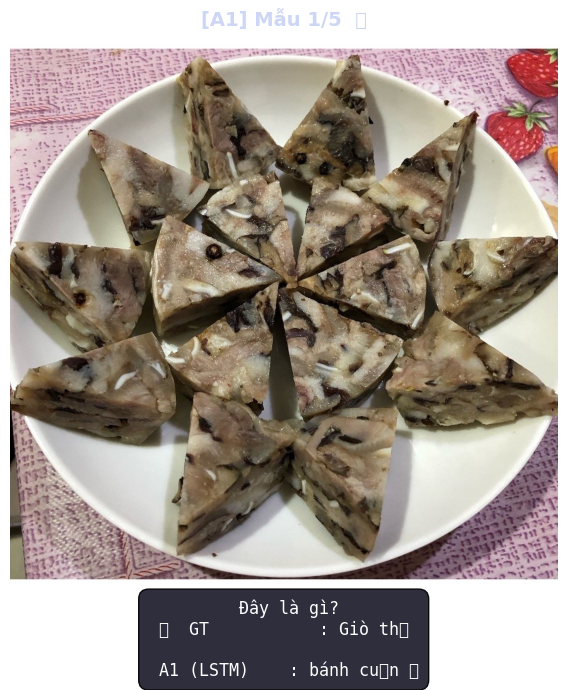

/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7843 (\N{LATIN SMALL LETTER A WITH HOOK ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7875 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND HOOK ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7873 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND GRAVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7855 (\N{LATIN SMALL LETTER A WITH BREVE AND ACUTE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7861 (\N{LATIN SMALL LETTER A WITH BREVE AND TILDE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 7843 (\N{LATIN SMALL LETTER A WITH HOOK ABOVE}) m

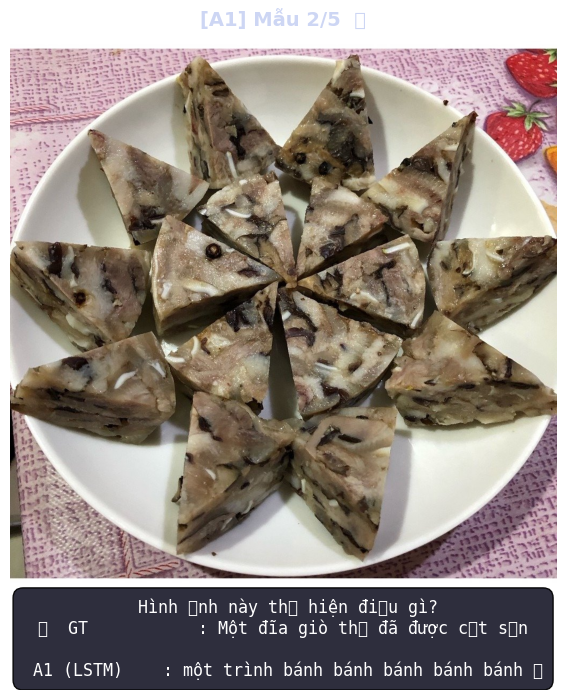

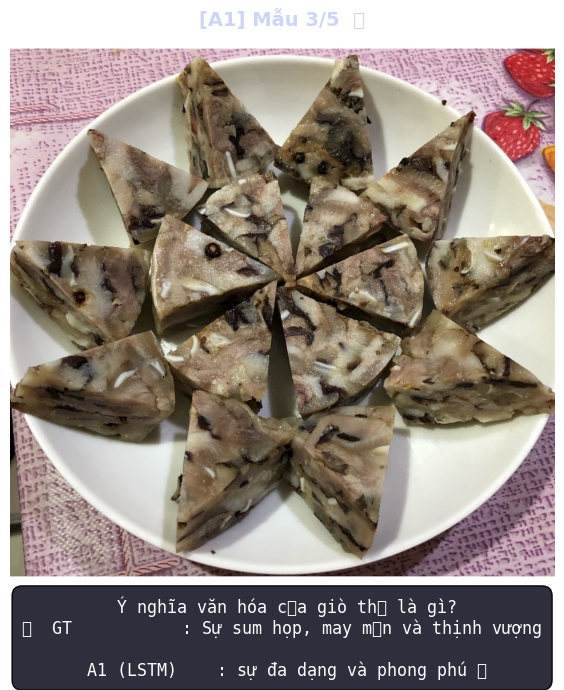

/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7871 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND ACUTE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 7871 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND ACUTE}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)


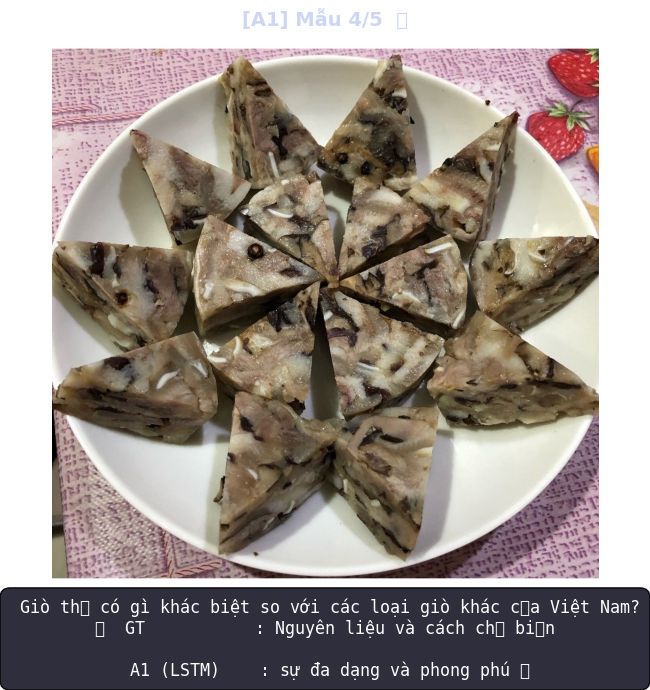

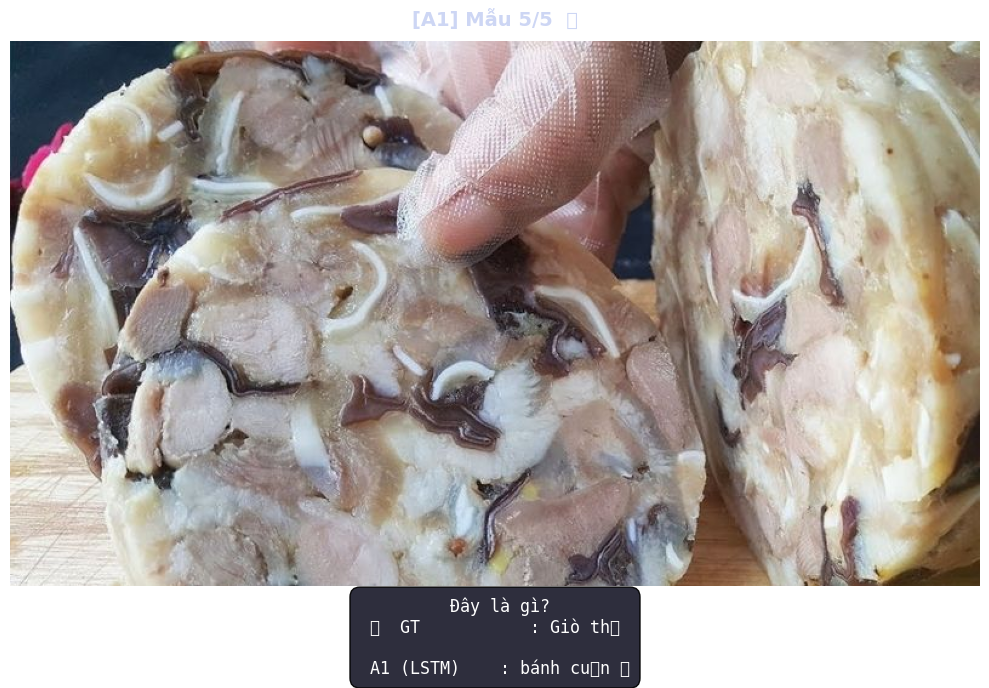

In [20]:
print('=' * 55)
print('  DEMO A1 — ResNet50 + LSTM Decoder')
print('=' * 55)

for i, sample in enumerate(test_samples[:5]):
    try:
        img = Image.open(sample['image_path']).convert('RGB')
    except Exception:
        print(f'[{i+1}] Lỗi ảnh: {sample["image_path"]}'); continue

    pred  = predict_a1(img, sample['question'])
    match = '✅' if pred.lower().strip() == sample['answer'].lower().strip() else '❌'
    show_prediction(
        image=img, question=sample['question'],
        ground_truth=sample['answer'], pred_a1=pred,
        title=f'[A1] Mẫu {i+1}/5  {match}'
    )

## 10. PHẦN 2 — Demo A2 (Transformer Decoder)

  DEMO A2 — ResNet50 + Transformer Decoder


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/activation.py:1336: UserWarning: Support for mismatched key_padding_mask and attn_mask is deprecated. Use same type for both instead.
  key_padding_mask = F._canonical_mask(
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7911 (\N{LATIN SMALL LETTER U WITH HOOK ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()


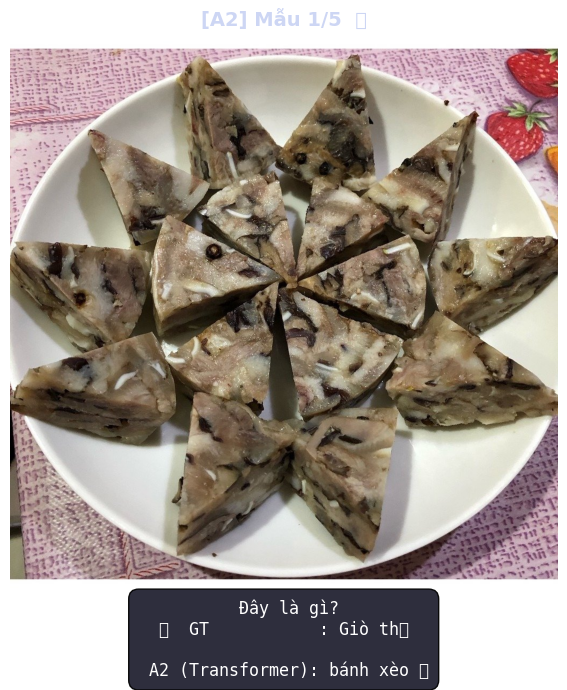

/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7843 (\N{LATIN SMALL LETTER A WITH HOOK ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7875 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND HOOK ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7873 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND GRAVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7855 (\N{LATIN SMALL LETTER A WITH BREVE AND ACUTE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7861 (\N{LATIN SMALL LETTER A WITH BREVE AND TILDE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7871 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Deja

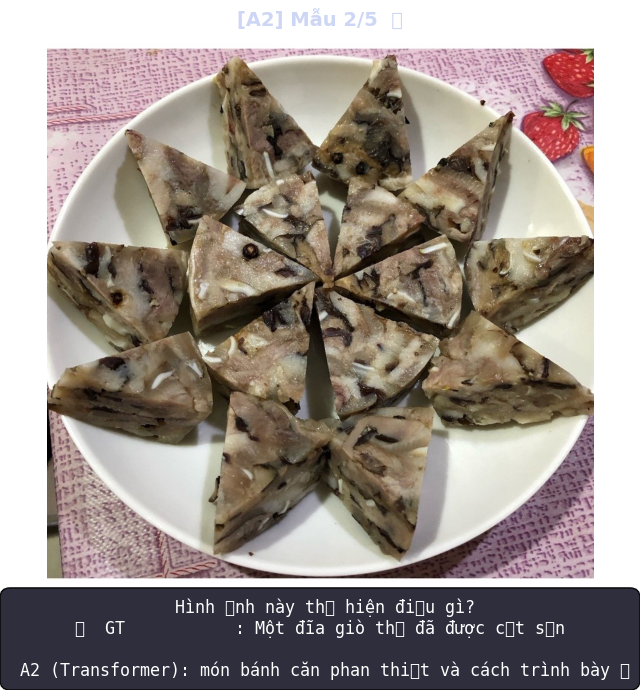

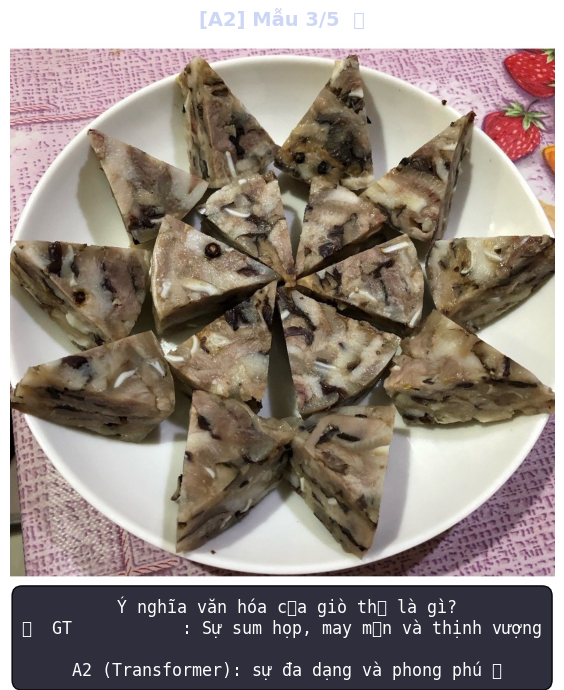

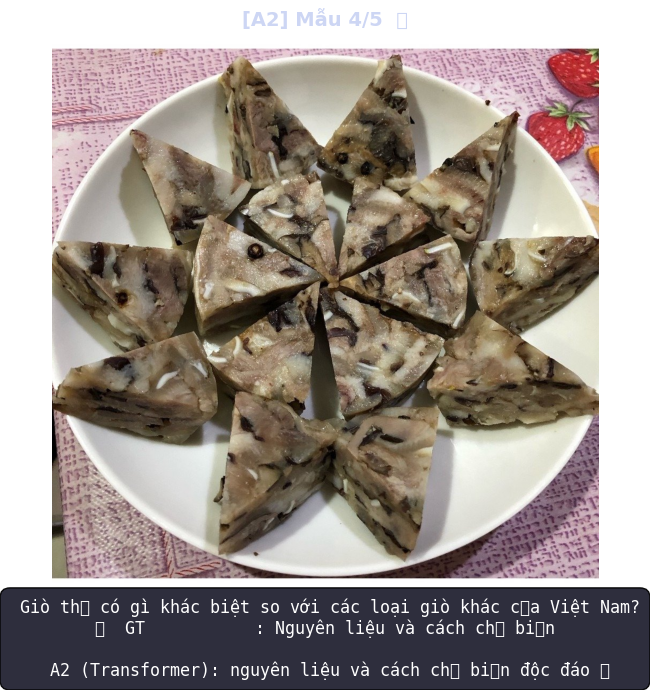

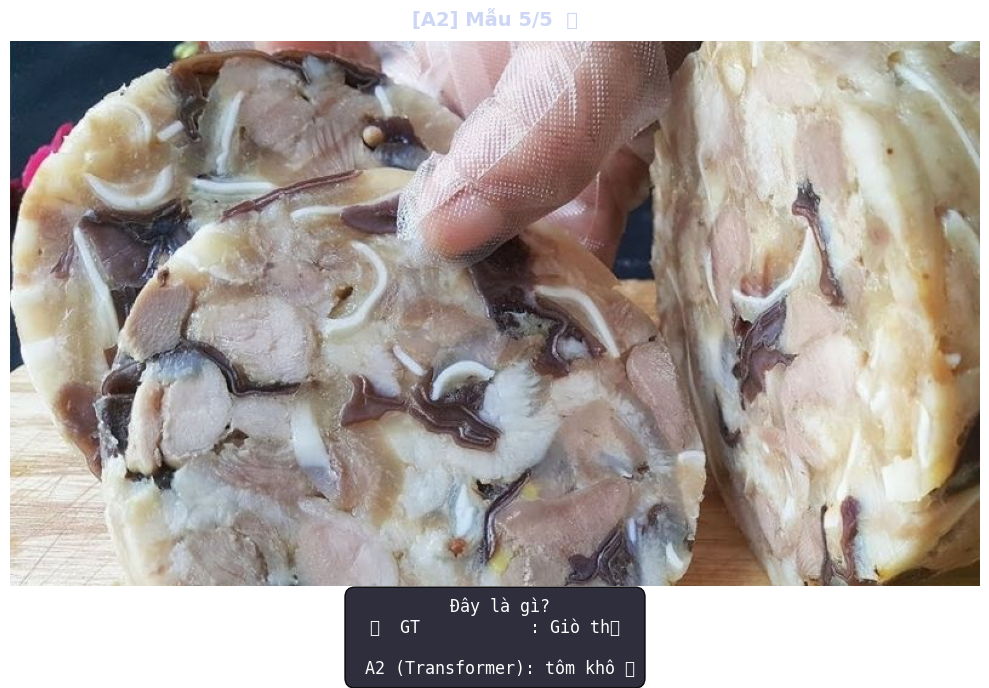

In [21]:
print('=' * 55)
print('  DEMO A2 — ResNet50 + Transformer Decoder')
print('=' * 55)

for i, sample in enumerate(test_samples[:5]):
    try:
        img = Image.open(sample['image_path']).convert('RGB')
    except Exception:
        print(f'[{i+1}] Lỗi ảnh'); continue

    pred  = predict_a2(img, sample['question'])
    match = '✅' if pred.lower().strip() == sample['answer'].lower().strip() else '❌'
    show_prediction(
        image=img, question=sample['question'],
        ground_truth=sample['answer'], pred_a2=pred,
        title=f'[A2] Mẫu {i+1}/5  {match}'
    )

## 11. PHẦN 3 — Demo B1 (Zero-shot) & B2 (Fine-tuned LoRA)

  DEMO B1 (Zero-shot) vs B2 (Fine-tuned LoRA)


/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7911 (\N{LATIN SMALL LETTER U WITH HOOK ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7889 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND ACUTE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()


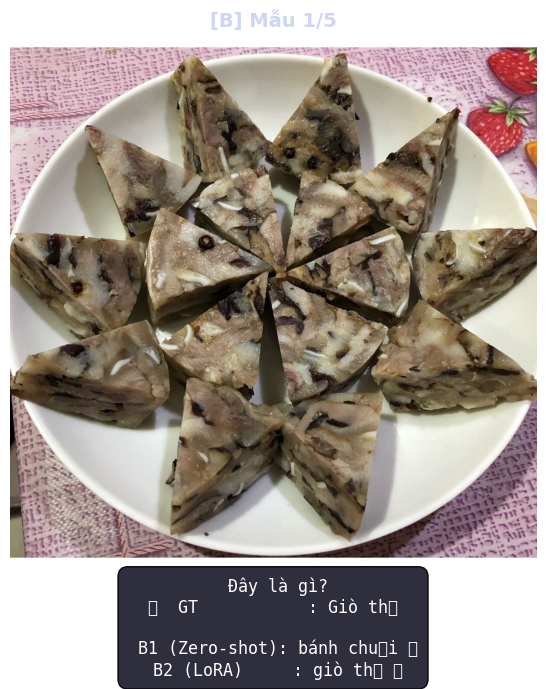

/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7843 (\N{LATIN SMALL LETTER A WITH HOOK ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7875 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND HOOK ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7873 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND GRAVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7855 (\N{LATIN SMALL LETTER A WITH BREVE AND ACUTE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7861 (\N{LATIN SMALL LETTER A WITH BREVE AND TILDE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7871 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Deja

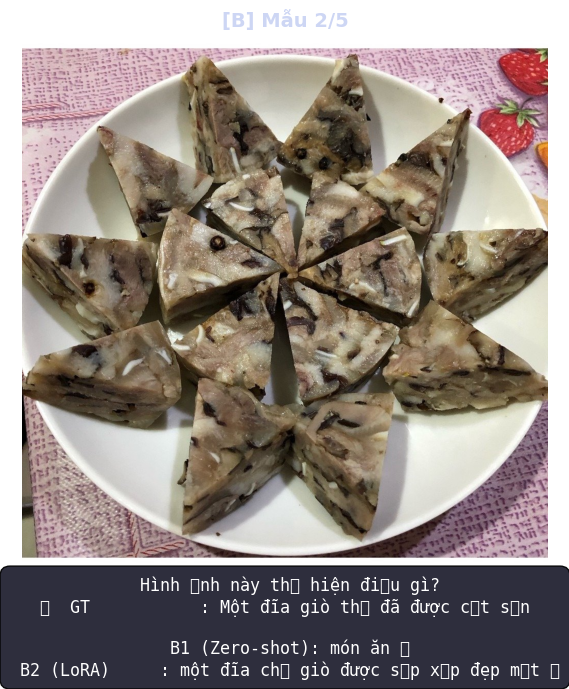

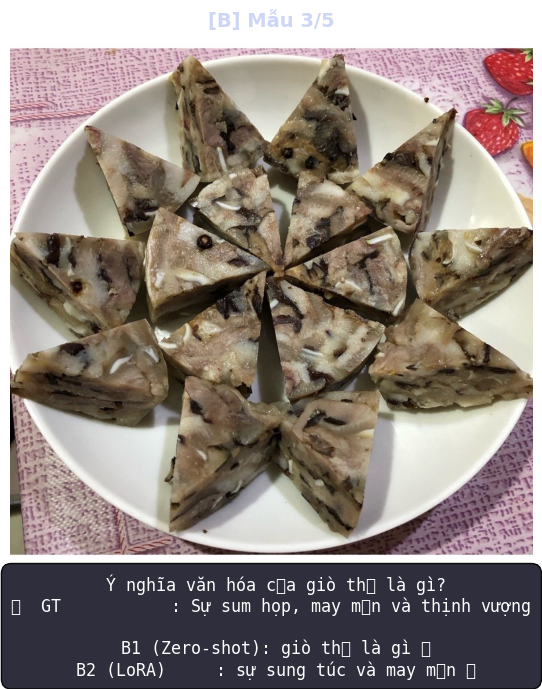

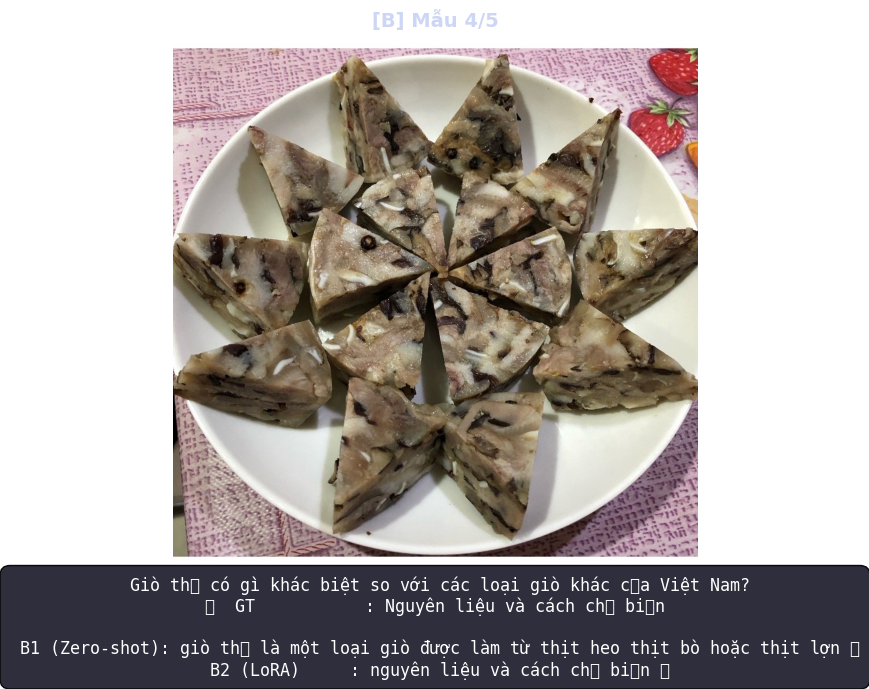

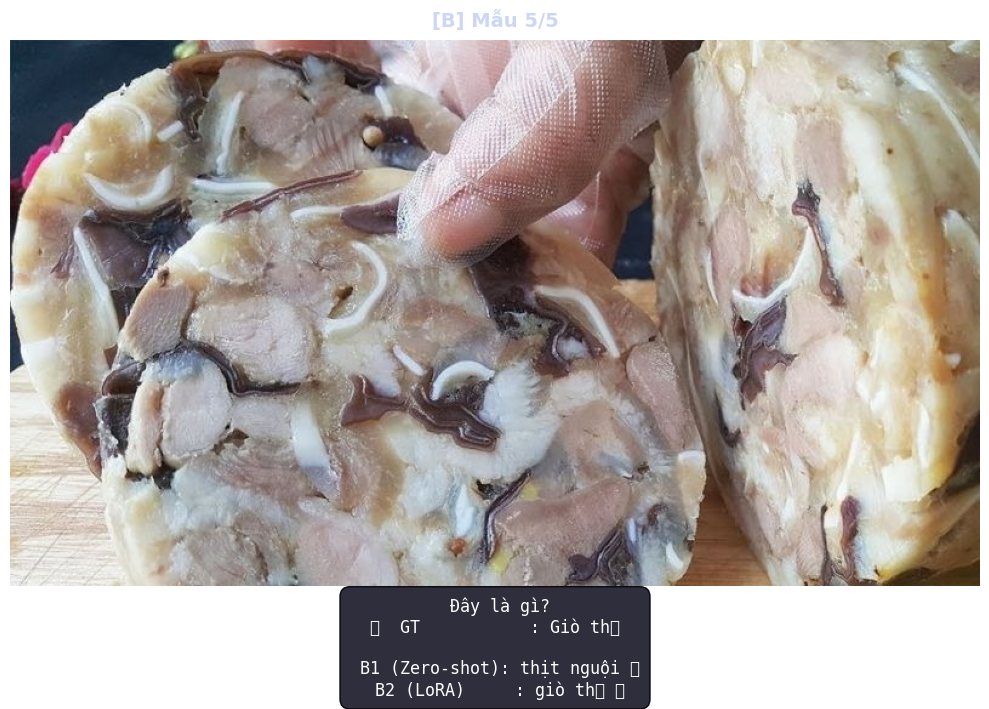

In [22]:
print('=' * 55)
print('  DEMO B1 (Zero-shot) vs B2 (Fine-tuned LoRA)')
print('=' * 55)

for i, sample in enumerate(test_samples[:5]):
    try:
        img = Image.open(sample['image_path']).convert('RGB')
    except Exception:
        continue

    # Ưu tiên dùng predictions đã lưu sẵn (nhanh), fallback inference trực tiếp
    pb1 = preds_b1[i]['prediction'] if i < len(preds_b1) else predict_paligemma(model_b1, img, sample['question'])
    pb2 = preds_b2[i]['prediction'] if i < len(preds_b2) else predict_paligemma(model_b2, img, sample['question'])

    show_prediction(
        image=img, question=sample['question'],
        ground_truth=sample['answer'],
        pred_b1=pb1, pred_b2=pb2,
        title=f'[B] Mẫu {i+1}/5'
    )

## 12. PHẦN 4 — So sánh đồng thời A1 + A2 + B1 + B2

  SO SÁNH 4 CẤU HÌNH — A1 / A2 / B1 / B2


/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7911 (\N{LATIN SMALL LETTER U WITH HOOK ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7889 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND ACUTE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()


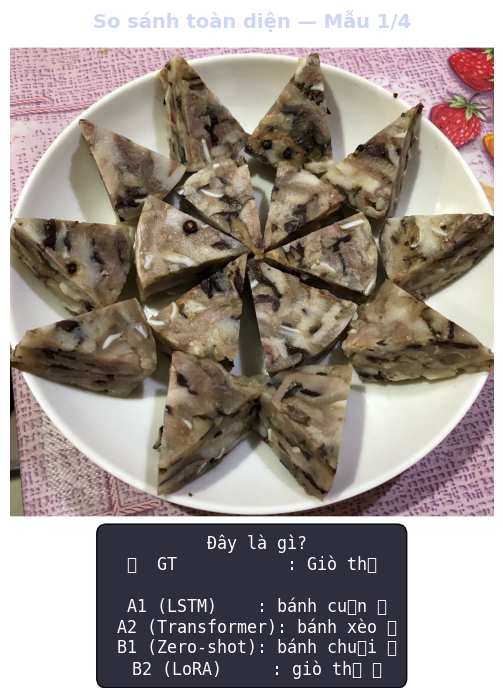

/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7843 (\N{LATIN SMALL LETTER A WITH HOOK ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7875 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND HOOK ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7873 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND GRAVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7855 (\N{LATIN SMALL LETTER A WITH BREVE AND ACUTE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7861 (\N{LATIN SMALL LETTER A WITH BREVE AND TILDE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7871 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Deja

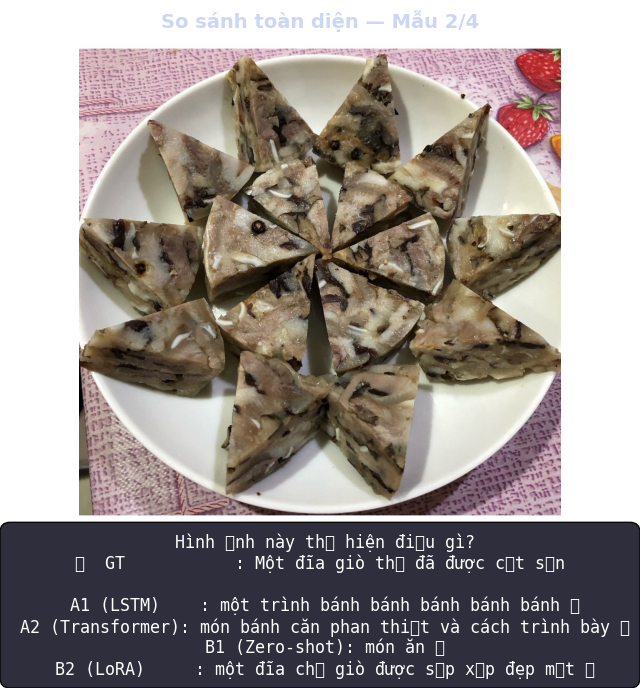

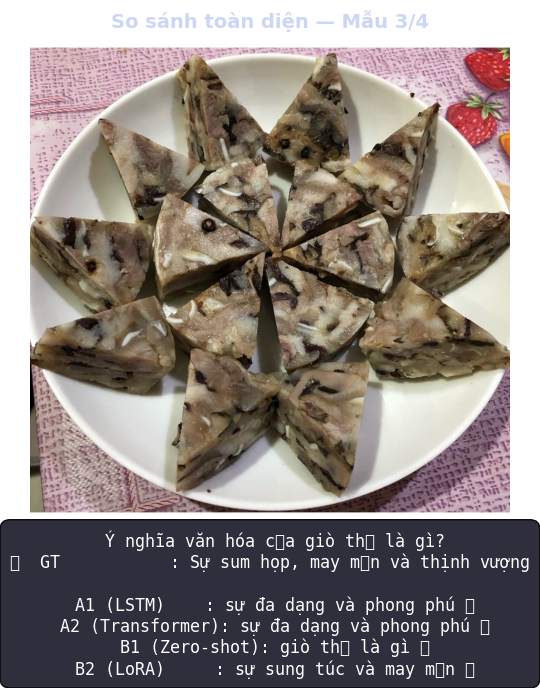

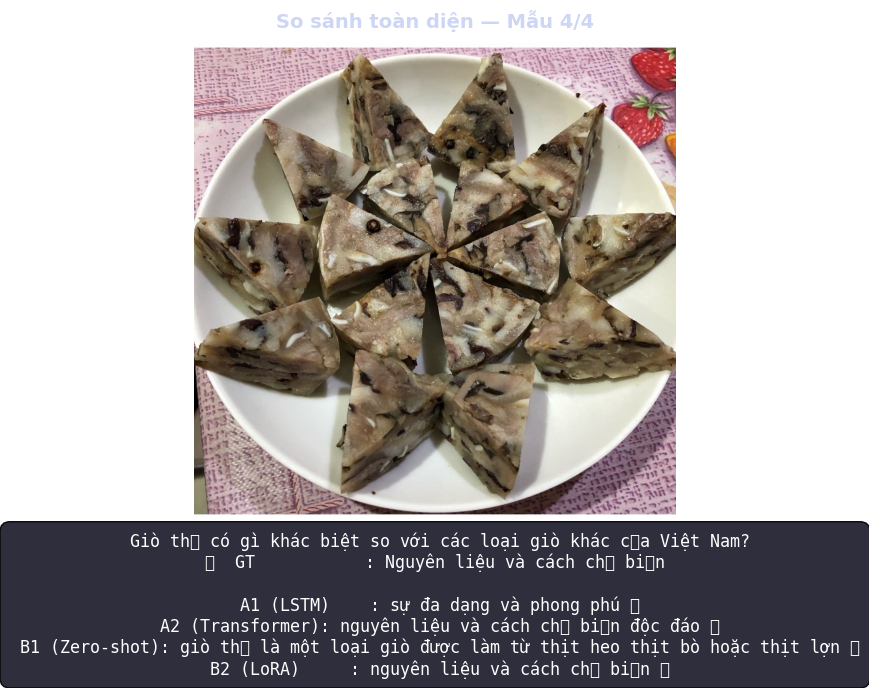

In [23]:
print('=' * 55)
print('  SO SÁNH 4 CẤU HÌNH — A1 / A2 / B1 / B2')
print('=' * 55)

for i, sample in enumerate(test_samples[:4]):
    try:
        img = Image.open(sample['image_path']).convert('RGB')
    except Exception:
        continue

    pa1 = predict_a1(img, sample['question'])
    pa2 = predict_a2(img, sample['question'])
    pb1 = preds_b1[i]['prediction'] if i < len(preds_b1) else predict_paligemma(model_b1, img, sample['question'])
    pb2 = preds_b2[i]['prediction'] if i < len(preds_b2) else predict_paligemma(model_b2, img, sample['question'])

    show_prediction(
        image=img, question=sample['question'],
        ground_truth=sample['answer'],
        pred_a1=pa1, pred_a2=pa2,
        pred_b1=pb1, pred_b2=pb2,
        title=f'So sánh toàn diện — Mẫu {i+1}/4'
    )

## 13. PHẦN 5 — Biểu đồ so sánh Metrics (4 cấu hình)

⏳ Chưa có file kết quả — bắt đầu evaluate toàn test set...
   Tổng số mẫu: 489

[1/4] A1 — ResNet50 + LSTM Decoder


  A1:   0%|          | 0/489 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(



[2/4] A2 — ResNet50 + Transformer Decoder


  A2:   0%|          | 0/489 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/nn/modules/activation.py:1336: UserWarning: Support for mismatched key_padding_mask and attn_mask is deprecated. Use same type for both instead.
  key_padding_mask = F._canonical_mask(



[3/4] B1 — PaliGemma Zero-shot


  B1:   0%|          | 0/489 [00:00<?, ?it/s]


[4/4] B2 — PaliGemma Fine-tuned (LoRA)


  B2:   0%|          | 0/489 [00:00<?, ?it/s]


⏳ Tính metrics (BERTScore hơi lâu ~2-3 phút)...

  ĐÁNH GIÁ CẤU HÌNH: A1 (LSTM)
  Số mẫu: 489
→ Tính VQA Accuracy (exact match)...
→ Tính BLEU...
→ Tính ROUGE-L...
→ Tính METEOR (đã sửa chunk counting)...
→ Tính BERTScore (vinai/phobert-base)...
  [Cảnh báo] BERTScore lỗi: 'vinai/phobert-base'

────────────────────────────────────────
  KẾT QUẢ [A1 (LSTM)]
────────────────────────────────────────
  vqa_accuracy                 1.43
  num_samples                  489
  mode                         exact
  bleu_1                       15.82
  bleu_2                       3.84
  bleu_3                       2.54
  bleu_4                       1.73
  rouge_l                      17.75
  meteor                       10.7
────────────────────────────────────────


  ĐÁNH GIÁ CẤU HÌNH: A2 (Transformer)
  Số mẫu: 489
→ Tính VQA Accuracy (exact match)...
→ Tính BLEU...
→ Tính ROUGE-L...
→ Tính METEOR (đã sửa chunk counting)...
→ Tính BERTScore (vinai/phobert-base)...
  [Cảnh báo] BERTScore lỗi

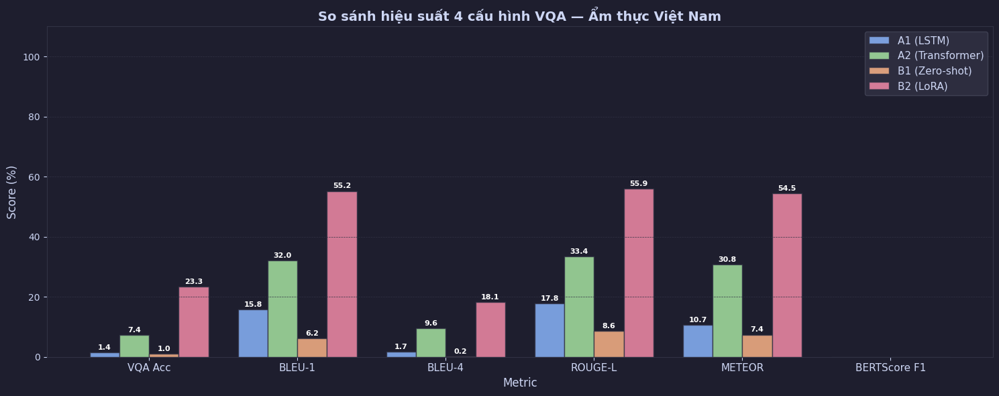

✅ Đã lưu biểu đồ → /content/drive/MyDrive/Vietnamese_Cuisine_v1.0/comparison_chart_4configs.png


In [40]:
# ══════════════════════════════════════════════════════════════════════════════
# PHẦN 5 — Tính metrics thật & vẽ biểu đồ so sánh 4 cấu hình
# Tự động chạy inference A1/A2 nếu chưa có file kết quả
# ══════════════════════════════════════════════════════════════════════════════
from tqdm.auto import tqdm

RESULTS_PATH = f'{DRIVE_ROOT}/results_ALL.json'

# ── Bước 1: Load hoặc tính RESULTS ───────────────────────────────────────────
if os.path.exists(RESULTS_PATH):
    with open(RESULTS_PATH, 'r', encoding='utf-8') as f:
        RESULTS = json.load(f)
    print(f'✅ Đã load kết quả từ {RESULTS_PATH}')

else:
    print('⏳ Chưa có file kết quả — bắt đầu evaluate toàn test set...')
    print(f'   Tổng số mẫu: {len(test_samples)}')

    # ── Helper: chạy inference 1 model trên toàn test set ────────────────────
    def run_inference(predict_fn, config_name, fallback_preds=None):
        """
        Chạy predict_fn trên toàn test_samples.
        Nếu fallback_preds đã có (B1/B2) thì dùng luôn, không inference lại.
        """
        preds, gts, qs = [], [], []
        for i, sample in enumerate(tqdm(test_samples, desc=f'  {config_name}')):
            gt = sample['answer']
            # Dùng prediction đã lưu nếu có (B1/B2)
            if fallback_preds and i < len(fallback_preds):
                pred = fallback_preds[i].get('prediction', '')
            else:
                try:
                    img = Image.open(sample['image_path']).convert('RGB')
                except Exception:
                    img = Image.new('RGB', (224, 224), 0)
                try:
                    pred = predict_fn(img, sample['question'])
                except Exception as e:
                    pred = ''
                    print(f'    [WARN] {config_name} mẫu {i}: {e}')
            preds.append(pred)
            gts.append([gt])
            qs.append(sample['question'])
        return preds, gts, qs

    # ── Chạy 4 cấu hình ──────────────────────────────────────────────────────
    print('\n[1/4] A1 — ResNet50 + LSTM Decoder')
    preds_a1, gts_a1, qs_a1 = run_inference(predict_a1, 'A1')

    print('\n[2/4] A2 — ResNet50 + Transformer Decoder')
    preds_a2, gts_a2, qs_a2 = run_inference(predict_a2, 'A2')

    print('\n[3/4] B1 — PaliGemma Zero-shot')
    if preds_b1:
        # Đã có predictions_B1.json → dùng luôn
        preds_b1_inf, gts_b1, qs_b1 = run_inference(None, 'B1', fallback_preds=preds_b1)
    else:
        # Chưa có → inference trực tiếp (chậm)
        preds_b1_inf, gts_b1, qs_b1 = run_inference(
            lambda img, q: predict_paligemma(model_b1, img, q), 'B1'
        )

    print('\n[4/4] B2 — PaliGemma Fine-tuned (LoRA)')
    if preds_b2:
        preds_b2_inf, gts_b2, qs_b2 = run_inference(None, 'B2', fallback_preds=preds_b2)
    elif model_b2 is not None:
        preds_b2_inf, gts_b2, qs_b2 = run_inference(
            lambda img, q: predict_paligemma(model_b2, img, q), 'B2'
        )
    else:
        print('  ⚠ Chưa có model_b2 — bỏ qua B2')
        preds_b2_inf, gts_b2, qs_b2 = [], [], []

    # ── Bước 2: Tính metrics cho từng cấu hình ───────────────────────────────
    print('\n⏳ Tính metrics (BERTScore hơi lâu ~2-3 phút)...')

    def compute_metrics(preds, gts, qs, config_name):
        if not preds:
            return {'config': config_name,
                    'vqa_accuracy': 0.0, 'bleu_1': 0.0, 'bleu_4': 0.0,
                    'rouge_l': 0.0, 'meteor': 0.0, 'bertscore_f1': 0.0}
        res = evaluate_all(
            predictions=preds,
            ground_truths_list=gts,
            questions=qs,
            use_bertscore=True,
            use_llm_judge=False,   # LLM judge chạy riêng nếu cần
            config_name=config_name,
        )
        return {
            'config'       : config_name,
            'vqa_accuracy' : res.get('vqa_accuracy', 0.0),
            'bleu_1'       : res.get('bleu_1', 0.0),
            'bleu_4'       : res.get('bleu_4', 0.0),
            'rouge_l'      : res.get('rouge_l', 0.0),
            'meteor'       : res.get('meteor', 0.0),
            'bertscore_f1' : res.get('bertscore_f1', 0.0),
        }

    results_a1 = compute_metrics(preds_a1, gts_a1, qs_a1, 'A1 (LSTM)')
    results_a2 = compute_metrics(preds_a2, gts_a2, qs_a2, 'A2 (Transformer)')
    results_b1 = compute_metrics(preds_b1_inf, gts_b1, qs_b1, 'B1 (Zero-shot)')
    results_b2 = compute_metrics(preds_b2_inf, gts_b2, qs_b2, 'B2 (LoRA)')

    RESULTS = [results_a1, results_a2, results_b1, results_b2]

    # ── Lưu kết quả để lần sau không cần chạy lại ────────────────────────────
    with open(RESULTS_PATH, 'w', encoding='utf-8') as f:
        json.dump(RESULTS, f, ensure_ascii=False, indent=2)
    print(f'\n✅ Đã lưu kết quả → {RESULTS_PATH}')

# ── Bước 3: In bảng so sánh ──────────────────────────────────────────────────
print('\n' + '='*70)
print(f'{"Config":<20} {"VQA Acc":>8} {"BLEU-1":>8} {"BLEU-4":>8} {"ROUGE-L":>8} {"METEOR":>8} {"BERTScore":>10}')
print('-'*70)
for r in RESULTS:
    print(f'{r["config"]:<20} '
          f'{r["vqa_accuracy"]:>7.1f}% '
          f'{r["bleu_1"]:>7.1f}% '
          f'{r["bleu_4"]:>7.1f}% '
          f'{r["rouge_l"]:>7.1f}% '
          f'{r["meteor"]:>7.1f}% '
          f'{r["bertscore_f1"]:>9.1f}%')
print('='*70)

# ── Bước 4: Vẽ biểu đồ ───────────────────────────────────────────────────────
METRICS       = ['vqa_accuracy', 'bleu_1', 'bleu_4', 'rouge_l', 'meteor', 'bertscore_f1']
METRIC_LABELS = ['VQA Acc', 'BLEU-1', 'BLEU-4', 'ROUGE-L', 'METEOR', 'BERTScore F1']
COLORS        = ['#89b4fa', '#a6e3a1', '#fab387', '#f38ba8']

x     = np.arange(len(METRICS))
width = 0.20
n     = len(RESULTS)

fig, ax = plt.subplots(figsize=(15, 6))
fig.patch.set_facecolor('#1e1e2e')
ax.set_facecolor('#1e1e2e')

for i, (res, color) in enumerate(zip(RESULTS, COLORS)):
    vals   = [res.get(m, 0) for m in METRICS]
    offset = (i - n / 2 + 0.5) * width
    bars   = ax.bar(x + offset, vals, width, label=res['config'],
                    color=color, alpha=0.85, edgecolor='#313244')
    for bar, v in zip(bars, vals):
        if v > 0:
            ax.text(bar.get_x() + bar.get_width() / 2,
                    bar.get_height() + 0.5,
                    f'{v:.1f}', ha='center', va='bottom',
                    fontsize=8, color='white', fontweight='bold')

ax.set_xlabel('Metric', color='#cdd6f4', fontsize=12)
ax.set_ylabel('Score (%)', color='#cdd6f4', fontsize=12)
ax.set_title('So sánh hiệu suất 4 cấu hình VQA — Ẩm thực Việt Nam',
             color='#cdd6f4', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(METRIC_LABELS, color='#cdd6f4', fontsize=11)
ax.tick_params(colors='#cdd6f4')
ax.yaxis.set_tick_params(labelcolor='#cdd6f4')
ax.spines[:].set_color('#313244')
ax.set_ylim(0, 110)
ax.legend(facecolor='#313244', edgecolor='#45475a',
          labelcolor='#cdd6f4', fontsize=11, loc='upper right')
ax.grid(axis='y', color='#313244', linewidth=0.5, linestyle='--')

plt.tight_layout()
chart_path = f'{DRIVE_ROOT}/comparison_chart_4configs.png'
plt.savefig(chart_path, dpi=150, bbox_inches='tight', facecolor='#1e1e2e')
plt.show()
print(f'✅ Đã lưu biểu đồ → {chart_path}')

## 14. PHẦN 6 — Interactive Demo (upload ảnh + câu hỏi tùy ý)

In [41]:
from google.colab import files as colab_files

print('📤 Upload ảnh bất kỳ (jpg/png):')
uploaded = colab_files.upload()

if uploaded:
    custom_img = Image.open(list(uploaded.keys())[0]).convert('RGB')
    print(f' Đã upload: {list(uploaded.keys())[0]}')
else:
    custom_img = Image.open(test_samples[0]['image_path']).convert('RGB')
    print(' Không upload — dùng ảnh đầu test set')

📤 Upload ảnh bất kỳ (jpg/png):


Saving 000001.jpg to 000001.jpg
 Đã upload: 000001.jpg


Câu hỏi: Đây là món gì?
Đang inference 4 cấu hình...


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/activation.py:1336: UserWarning: Support for mismatched key_padding_mask and attn_mask is deprecated. Use same type for both instead.
  key_padding_mask = F._canonical_mask(



 A1 (LSTM)        : bánh cuốn
 A2 (Transformer)  : bánh bao hấp
 B1 (Zero-shot)    : buns
 B2 (LoRA)         : bánh bao


/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7889 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND ACUTE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipykernel_1476/4114937354.py:38: UserWarning: Glyph 7845 (\N{LATIN SMALL LETTER A WITH CIRCUMFLEX AND ACUTE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 7889 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND ACUTE}) miss

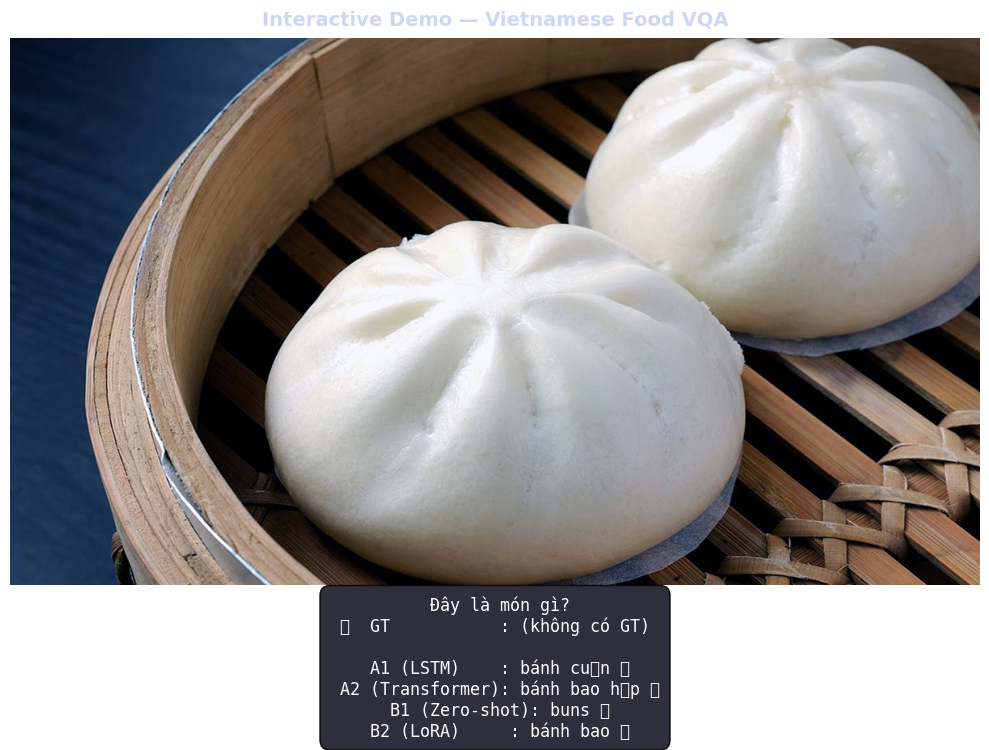

In [42]:
# ── Thay câu hỏi tùy ý ───────────────────────────────────────────────────────
CUSTOM_QUESTION = 'Đây là món gì?'   # ← đổi câu hỏi ở đây
CUSTOM_GT       = '(không có GT)'    # ← điền đáp án nếu biết

print(f'Câu hỏi: {CUSTOM_QUESTION}')
print('Đang inference 4 cấu hình...')

ca1 = predict_a1(custom_img, CUSTOM_QUESTION)
ca2 = predict_a2(custom_img, CUSTOM_QUESTION)
cb1 = predict_paligemma(model_b1, custom_img, CUSTOM_QUESTION)
cb2 = predict_paligemma(model_b2, custom_img, CUSTOM_QUESTION)

print(f'\n A1 (LSTM)        : {ca1}')
print(f' A2 (Transformer)  : {ca2}')
print(f' B1 (Zero-shot)    : {cb1}')
print(f' B2 (LoRA)         : {cb2}')

show_prediction(
    image=custom_img, question=CUSTOM_QUESTION,
    ground_truth=CUSTOM_GT,
    pred_a1=ca1, pred_a2=ca2,
    pred_b1=cb1, pred_b2=cb2,
    title='Interactive Demo — Vietnamese Food VQA'
)

## 15. PHẦN 7 — Full Evaluation (tùy chọn, comment sẵn)

In [43]:
try:
    from metrics import evaluate_all, compare_configs, save_results
    print(' metrics.py loaded!')
except ImportError:
    print(' metrics.py chưa có — kiểm tra bước mount Drive.')

 metrics.py loaded!


In [44]:
# ── Evaluate A1 & A2 trên toàn test set (~10-20 phút) ────────────────────────

for model_name, predict_fn in [('A1', predict_a1), ('A2', predict_a2)]:
    preds, gts, qs = [], [], []
    for sample in tqdm(test_samples, desc=f'Evaluating {model_name}'):
        try:
            img = Image.open(sample['image_path']).convert('RGB')
        except Exception:
            img = Image.new('RGB', (224, 224), 0)
        preds.append(predict_fn(img, sample['question']))
        gts.append([sample['answer']])
        qs.append(sample['question'])
    results = evaluate_all(
        predictions=preds, ground_truths_list=gts,
        questions=qs, use_bertscore=True, config_name=model_name
    )
    print(results)

# ── Tổng hợp & lưu ───────────────────────────────────────────────────────────
compare_configs([results_a1, results_a2, results_b1, results_b2])
save_results([results_a1, results_a2, results_b1, results_b2],
             f'{DRIVE_ROOT}/results_ALL.json')


Evaluating A1:   0%|          | 0/489 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(



  ĐÁNH GIÁ CẤU HÌNH: A1
  Số mẫu: 489
→ Tính VQA Accuracy (exact match)...
→ Tính BLEU...
→ Tính ROUGE-L...
→ Tính METEOR (đã sửa chunk counting)...
→ Tính BERTScore (vinai/phobert-base)...
  [Cảnh báo] BERTScore lỗi: 'vinai/phobert-base'

────────────────────────────────────────
  KẾT QUẢ [A1]
────────────────────────────────────────
  vqa_accuracy                 1.43
  num_samples                  489
  mode                         exact
  bleu_1                       15.82
  bleu_2                       3.84
  bleu_3                       2.54
  bleu_4                       1.73
  rouge_l                      17.75
  meteor                       10.7
────────────────────────────────────────

{'config': 'A1', 'vqa_accuracy': np.float64(1.43), 'num_samples': 489, 'mode': 'exact', 'bleu_1': np.float64(15.82), 'bleu_2': np.float64(3.84), 'bleu_3': np.float64(2.54), 'bleu_4': np.float64(1.73), 'rouge_l': np.float64(17.75), 'meteor': np.float64(10.7)}


Evaluating A2:   0%|          | 0/489 [00:00<?, ?it/s]


  ĐÁNH GIÁ CẤU HÌNH: A2
  Số mẫu: 489
→ Tính VQA Accuracy (exact match)...
→ Tính BLEU...
→ Tính ROUGE-L...
→ Tính METEOR (đã sửa chunk counting)...
→ Tính BERTScore (vinai/phobert-base)...
  [Cảnh báo] BERTScore lỗi: 'vinai/phobert-base'

────────────────────────────────────────
  KẾT QUẢ [A2]
────────────────────────────────────────
  vqa_accuracy                 7.36
  num_samples                  489
  mode                         exact
  bleu_1                       32.04
  bleu_2                       20.86
  bleu_3                       12.84
  bleu_4                       9.56
  rouge_l                      33.36
  meteor                       30.76
────────────────────────────────────────

{'config': 'A2', 'vqa_accuracy': np.float64(7.36), 'num_samples': 489, 'mode': 'exact', 'bleu_1': np.float64(32.04), 'bleu_2': np.float64(20.86), 'bleu_3': np.float64(12.84), 'bleu_4': np.float64(9.56), 'rouge_l': np.float64(33.36), 'meteor': np.float64(30.76)}

  BẢNG SO SÁNH CÁC CẤU HÌNH


---
## Checklist trước khi quay video

- [ ] `CKPT_A1` trỏ đúng checkpoint A1 của Quang
- [ ] `CKPT_A2` trỏ đúng checkpoint A2 của Quang
- [ ] `CKPT_B2_DIR` trỏ đúng thư mục LoRA của Bảo
- [ ] `PRED_B1_JSON` và `PRED_B2_JSON` đã có (chạy xong `task1_vqa_B1.ipynb`)
- [ ] **Runtime → Restart and run all** trước khi quay
- [ ] Thử Interactive Demo với ≥ 3 ảnh thực tế khác nhau

> **Kịch bản quay video (4–5 phút):**  
> `0:00` — Giới thiệu bài toán VQA Ẩm thực Việt Nam  
> `0:30` — Demo A1 (LSTM Decoder) — 5 mẫu  
> `1:15` — Demo A2 (Transformer Decoder) — 5 mẫu, so sánh ngắn với A1  
> `2:00` — Demo B1 vs B2 — Zero-shot vs Fine-tuned  
> `3:00` — So sánh đồng thời 4 cấu hình + biểu đồ Metrics  
> `4:00` — Interactive Demo với ảnh thực tế  
> `4:45` — Kết luận: A2 > A1? B2 >> B1?